In [1]:
%load_ext autoreload
%autoreload 2

import preprocessing


df_raw = preprocessing.read_dataset("scaled_data.rds")


In [10]:
import polars as pl
print(df_raw.null_count())
df = preprocessing.preprocess(df_raw)
print(df.null_count())
print(df.columns)
df

shape: (1, 18)
┌────────┬───────┬──────┬──────┬───┬─────┬─────┬───────┬──────┐
│ Mallin ┆ Dates ┆ Evap ┆ NDVI ┆ … ┆ Cat ┆ Day ┆ Month ┆ Year │
│ ---    ┆ ---   ┆ ---  ┆ ---  ┆   ┆ --- ┆ --- ┆ ---   ┆ ---  │
│ u32    ┆ u32   ┆ u32  ┆ u32  ┆   ┆ u32 ┆ u32 ┆ u32   ┆ u32  │
╞════════╪═══════╪══════╪══════╪═══╪═════╪═════╪═══════╪══════╡
│ 0      ┆ 0     ┆ 0    ┆ 0    ┆ … ┆ 0   ┆ 0   ┆ 0     ┆ 0    │
└────────┴───────┴──────┴──────┴───┴─────┴─────┴───────┴──────┘
shape: (1, 23)
┌────────┬───────┬──────┬──────┬───┬───────┬──────┬──────────┬─────┐
│ Mallin ┆ Dates ┆ Evap ┆ NDVI ┆ … ┆ month ┆ year ┆ year_str ┆ id  │
│ ---    ┆ ---   ┆ ---  ┆ ---  ┆   ┆ ---   ┆ ---  ┆ ---      ┆ --- │
│ u32    ┆ u32   ┆ u32  ┆ u32  ┆   ┆ u32   ┆ u32  ┆ u32      ┆ u32 │
╞════════╪═══════╪══════╪══════╪═══╪═══════╪══════╪══════════╪═════╡
│ 0      ┆ 0     ┆ 0    ┆ 0    ┆ … ┆ 0     ┆ 0    ┆ 0        ┆ 0   │
└────────┴───────┴──────┴──────┴───┴───────┴──────┴──────────┴─────┘
['Mallin', 'Dates', 'Evap', 'NDVI', 'PP

Mallin,Dates,Evap,NDVI,PP,Rain_Days,Snow,Snow_Days,Tmax,Tmax_max,Tmin,Tmin_min,Lat,Lon,Cat,Day,Month,Year,day,month,year,year_str,id
str,date,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i32,f64,f64,i16,i8,i32,str,str
"""Mallin01""",2001-01-01,-1.62218,0.610736,0.816361,0.272727,-0.011728,0.0,-1.141096,0.227225,-0.47655,-0.338386,-39.68764,-71.03597,1.0,1,1.0,2001.0,1,1,2001,"""2001""","""Mallin01-2001"""
"""Mallin01""",2001-01-17,-2.304308,1.172737,0.416009,0.272727,0.002531,0.0,-1.806795,-0.816162,-1.086345,-0.951014,-39.68764,-71.03597,1.0,17,1.0,2001.0,17,1,2001,"""2001""","""Mallin01-2001"""
"""Mallin01""",2001-02-02,-0.64113,0.56219,0.589108,0.181818,0.002111,0.0,-1.50428,-0.53708,-1.444662,-1.09116,-39.68764,-71.03597,1.0,2,2.0,2001.0,33,2,2001,"""2001""","""Mallin01-2001"""
"""Mallin01""",2001-02-18,-2.803338,0.19666,0.000378,0.090909,0.002029,0.0,0.076931,0.102736,-1.275896,-1.01882,-39.68764,-71.03597,1.0,18,2.0,2001.0,49,2,2001,"""2001""","""Mallin01-2001"""
"""Mallin01""",2001-03-06,0.83369,0.988417,-0.371276,0.0,-0.005684,0.0,-0.270337,0.788329,-0.976413,0.297598,-39.68764,-71.03597,1.0,6,3.0,2001.0,65,3,2001,"""2001""","""Mallin01-2001"""
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""Mallin10""",2024-10-15,0.377692,0.446619,-0.683142,0.125,-0.333064,0.0,0.757088,-0.256488,0.319685,0.100256,-38.90979,-70.04698,3.0,15,10.0,2024.0,289,10,2024,"""2024""","""Mallin10-2024"""
"""Mallin10""",2024-10-31,1.311498,0.46444,-0.769485,0.0,-0.225614,0.0,2.873201,1.860431,2.237986,1.574457,-38.90979,-70.04698,3.0,31,10.0,2024.0,305,10,2024,"""2024""","""Mallin10-2024"""
"""Mallin10""",2024-11-16,1.052606,0.838022,-0.302676,0.125,-0.126133,0.0,0.132599,0.226712,0.252023,-0.101379,-38.90979,-70.04698,3.0,16,11.0,2024.0,321,11,2024,"""2024""","""Mallin10-2024"""


In [3]:
count_per_year=df.group_by(["Mallin","year"]).len().sort(pl.col("len"))

count_per_year.transpose()
#count_per_year.select([pl.col("len").unique_counts()])


column_0,column_1,column_2,column_3,column_4,column_5,column_6,column_7,column_8,column_9,column_10,column_11,column_12,column_13,column_14,column_15,column_16,column_17,column_18,column_19,column_20,column_21,column_22,column_23,column_24,column_25,column_26,column_27,column_28,column_29,column_30,column_31,column_32,column_33,column_34,column_35,column_36,…,column_203,column_204,column_205,column_206,column_207,column_208,column_209,column_210,column_211,column_212,column_213,column_214,column_215,column_216,column_217,column_218,column_219,column_220,column_221,column_222,column_223,column_224,column_225,column_226,column_227,column_228,column_229,column_230,column_231,column_232,column_233,column_234,column_235,column_236,column_237,column_238,column_239
str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,…,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str
"""Mallin05""","""Mallin04""","""Mallin07""","""Mallin03""","""Mallin01""","""Mallin10""","""Mallin10""","""Mallin08""","""Mallin01""","""Mallin01""","""Mallin02""","""Mallin01""","""Mallin09""","""Mallin09""","""Mallin07""","""Mallin09""","""Mallin04""","""Mallin05""","""Mallin07""","""Mallin03""","""Mallin07""","""Mallin10""","""Mallin06""","""Mallin10""","""Mallin09""","""Mallin02""","""Mallin09""","""Mallin06""","""Mallin08""","""Mallin05""","""Mallin01""","""Mallin05""","""Mallin09""","""Mallin03""","""Mallin03""","""Mallin09""","""Mallin02""",…,"""Mallin02""","""Mallin08""","""Mallin07""","""Mallin05""","""Mallin05""","""Mallin08""","""Mallin10""","""Mallin03""","""Mallin10""","""Mallin06""","""Mallin05""","""Mallin06""","""Mallin08""","""Mallin06""","""Mallin09""","""Mallin04""","""Mallin06""","""Mallin07""","""Mallin05""","""Mallin07""","""Mallin05""","""Mallin06""","""Mallin06""","""Mallin01""","""Mallin09""","""Mallin08""","""Mallin05""","""Mallin03""","""Mallin02""","""Mallin09""","""Mallin05""","""Mallin06""","""Mallin03""","""Mallin06""","""Mallin05""","""Mallin02""","""Mallin10"""
"""2024""","""2004""","""2004""","""2013""","""2022""","""2020""","""2002""","""2008""","""2008""","""2003""","""2003""","""2010""","""2023""","""2009""","""2010""","""2005""","""2011""","""2004""","""2018""","""2006""","""2016""","""2011""","""2008""","""2007""","""2016""","""2019""","""2007""","""2009""","""2020""","""2008""","""2023""","""2011""","""2006""","""2003""","""2015""","""2018""","""2014""",…,"""2009""","""2011""","""2006""","""2022""","""2007""","""2013""","""2017""","""2021""","""2006""","""2007""","""2021""","""2002""","""2017""","""2023""","""2002""","""2018""","""2005""","""2021""","""2010""","""2022""","""2020""","""2018""","""2019""","""2018""","""2012""","""2002""","""2023""","""2012""","""2010""","""2008""","""2018""","""2001""","""2014""","""2024""","""2002""","""2023""","""2013"""
"""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""",…,"""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23""","""23"""


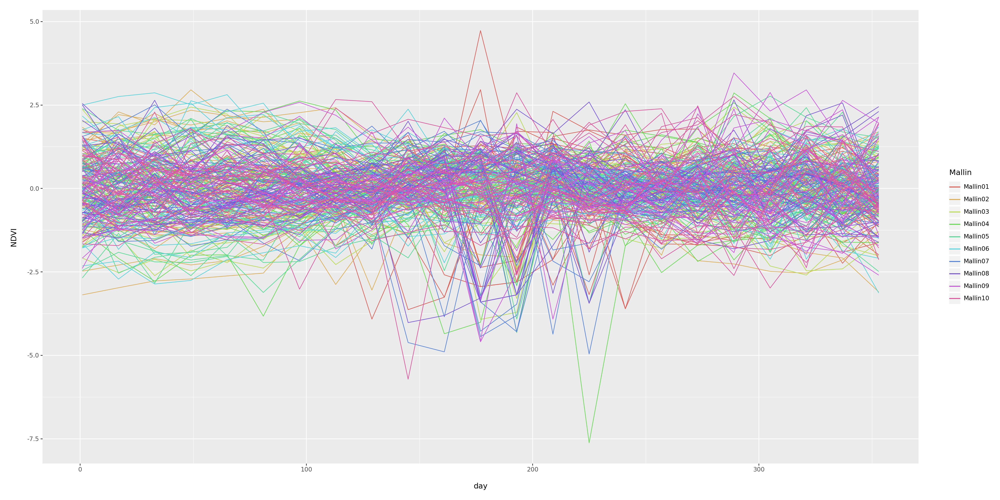

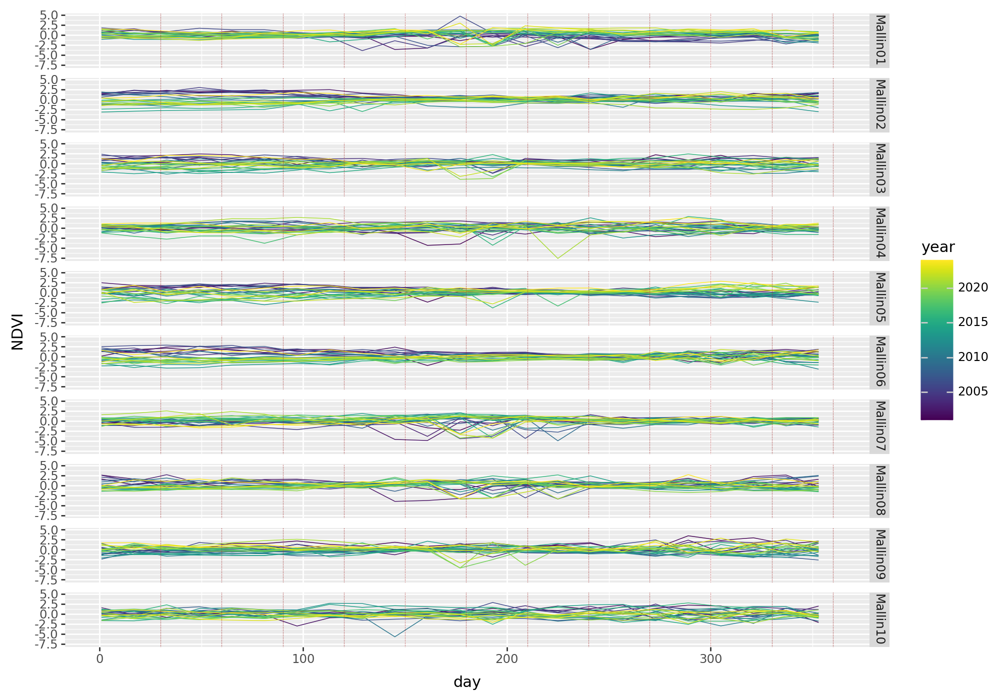

In [4]:

import plotnine as gg
#df2 = df[df["Mallin"]=="Mallin01"]



(gg.ggplot(df)
    + gg.geom_line(gg.aes(x='day', y="NDVI", group="id",color="Mallin"))
    + gg.theme(figure_size=(20, 10))
).show()


(
    gg.ggplot(df, gg.aes(x='day', y="NDVI",color="year",group="year"))
    + gg.geom_line(size=0.3)
    + gg.geom_vline(xintercept=[i*30 for i in range(1,13)],color="brown", size=0.25,linetype="dotted")  
    + gg.theme(figure_size=(10, 7))
    +gg.facet_grid("Mallin") 
).show()



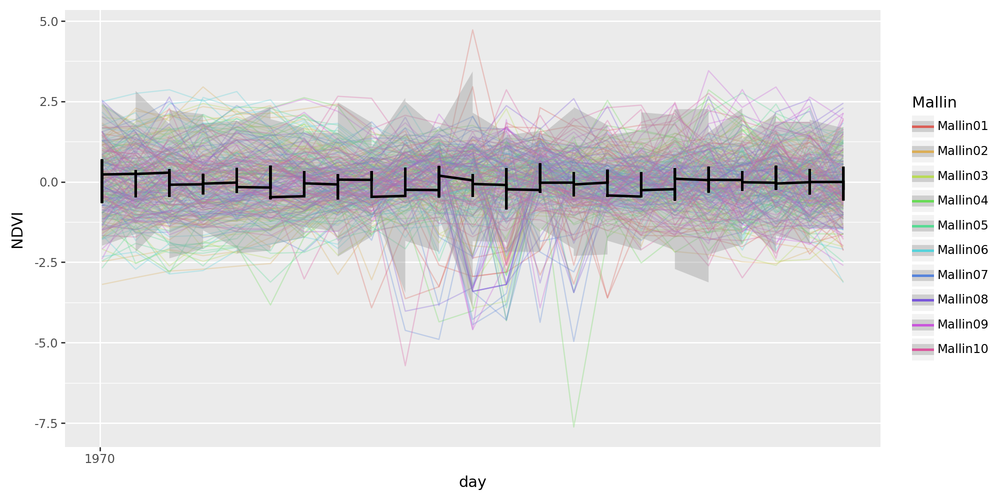

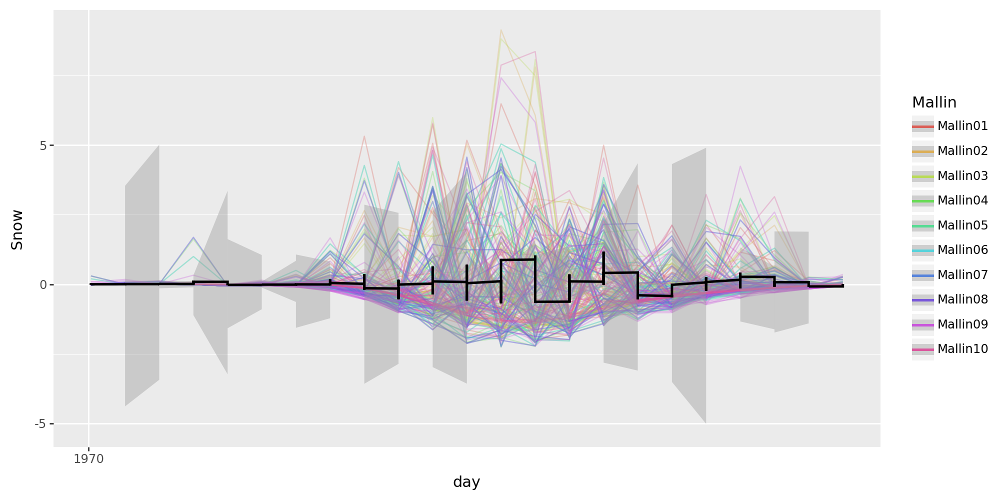

In [5]:
from mizani.breaks import date_breaks
from mizani.formatters import date_format

def interaction(*cats, sep="."):
    cats = [c.astype(str) for c in cats]
    return [sep.join(items) for items in zip(*cats)]

for y in ["NDVI","Snow"]:
    (gg.ggplot(df, gg.aes(x='day', y=y,color="Mallin",group="id"))
        + gg.geom_line(alpha=0.3)
        + gg.geom_smooth(method="mavg",group="year",size=1,alpha=0.4,method_args={"window":30})
        #+ gg.stat_smooth()
        + gg.theme(figure_size=(10, 5))
        + gg.scale_x_datetime(
        breaks=date_breaks(width="5 years"), labels=date_format("%Y")
    ) 
    ).show()

  



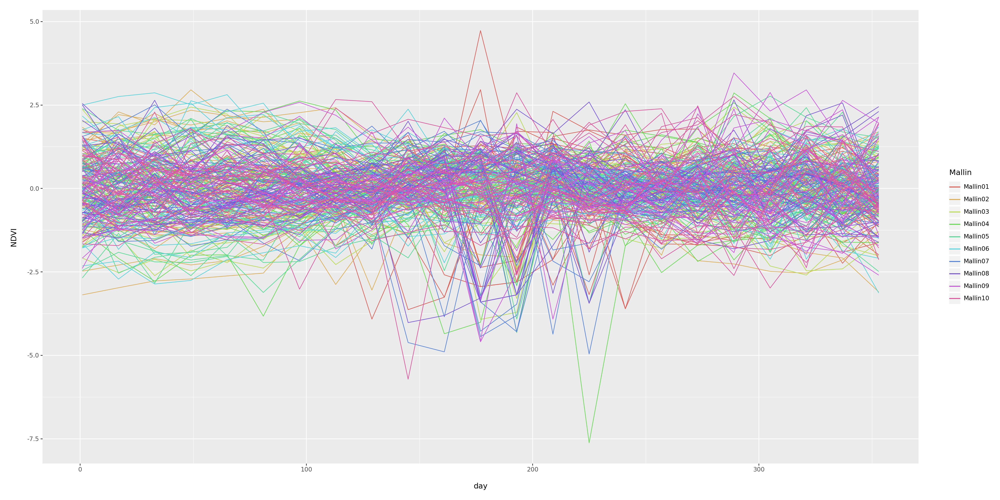

In [6]:
y = "NDVI"

(gg.ggplot(df)
    + gg.geom_line(gg.aes(x='day', y="NDVI", group="id",color="Mallin"))
    + gg.theme(figure_size=(20, 10))
).show()




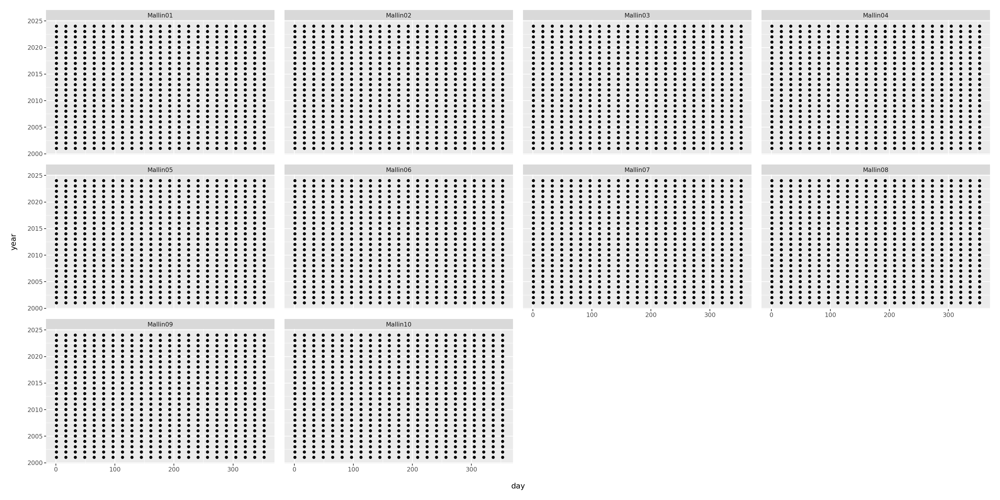

In [7]:
(gg.ggplot(df)
    +gg.geom_point(gg.aes(x='day', y="year",))
    #gg.geom_jitter(gg.aes(x='day', y="year", width="Mallin", height="Mallin", color="Mallin"))
    + gg.theme(figure_size=(20, 10))
    + gg.facet_wrap(facets="Mallin")
).show()

In [8]:

lens = df.group_by(["Mallin","month","day"]).len().filter(pl.col("len")<24).sort(pl.col("Mallin"))
lens.transpose()

df.group_by(["Mallin","year"]).len().unique("len")

Mallin,year,len
str,i32,u32
"""Mallin04""",2013,23


shape: (90, 3)
┌───────────┬──────────┬───────────┐
│ index     ┆ variable ┆ value     │
│ ---       ┆ ---      ┆ ---       │
│ str       ┆ str      ┆ f64       │
╞═══════════╪══════════╪═══════════╡
│ NDVI      ┆ Evap     ┆ -0.141837 │
│ PP        ┆ Evap     ┆ -0.265697 │
│ Rain_Days ┆ Evap     ┆ -0.331667 │
│ Snow      ┆ Evap     ┆ 0.073331  │
│ Snow_Days ┆ Evap     ┆ 0.015083  │
│ …         ┆ …        ┆ …         │
│ Snow      ┆ Tmin_min ┆ -0.273606 │
│ Snow_Days ┆ Tmin_min ┆ -0.314593 │
│ Tmax      ┆ Tmin_min ┆ 0.459119  │
│ Tmax_max  ┆ Tmin_min ┆ 0.268275  │
│ Tmin      ┆ Tmin_min ┆ 0.673092  │
└───────────┴──────────┴───────────┘


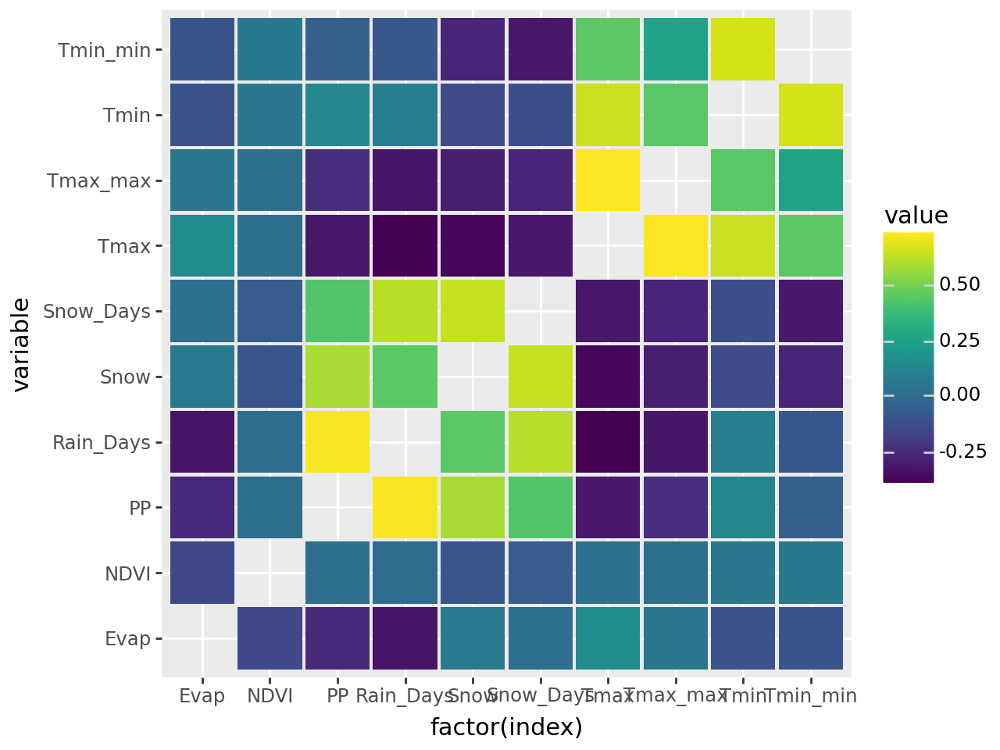

In [41]:
import polars as pl
import mizani.labels as ml


def corr_matrix(df:pl.DataFrame):
    
    return df.corr().with_columns(index = pl.lit(pl.Series(df.columns))).unpivot(index = "index").filter(pl.col("index") != pl.col("variable"))

corr_columns = ['Evap', 'NDVI', 'PP', 'Rain_Days', 'Snow', 'Snow_Days', 'Tmax', 'Tmax_max', 'Tmin', 'Tmin_min',]

corr = corr_matrix(df.select(corr_columns))
print(corr)

(
    gg.ggplot(corr, gg.aes("factor(index)", "variable", fill="value"))
    + gg.geom_tile(gg.aes(width=0.95, height=0.95))
    # + gg.geom_text(gg.aes(label="value",), size=3)
    # + gg.scale_(labels=ml.label_number())
    

)



In [ ]:
import darts as ds
import pandas as pd
from polars import exclude
dfm = df.filter(pl.col("Mallin")=="Mallin01")
pdf = dfm.to_pandas()
pdf = pdf.set_index("Dates")

pdf_m = pdf.asfreq("MS",method='bfill')

#ts = ds.TimeSeries.from_dataframe(pdf,time_col="Dates",value_cols="NDVI",fill_missing_dates=True,freq="d")

#ts
pdf_m


,Mallin,Evap,NDVI,PP,Rain_Days,Snow,Snow_Days,Tmax,Tmax_max,Tmin,...,Lon,Cat,Day,Month,Year,day,month,year,year_str,id
Dates,,,,,,,,,,,,,,,,,,,,,
2001-01-01,Mallin01,-1.622180,0.610736,0.816361,0.272727,-0.011728,0.000000,-1.141096,0.227225,-0.476550,...,-71.03597,1.0,1,1.0,2001.0,1,1,2001,2001,Mallin01-2001
2001-02-01,Mallin01,-0.641130,0.562190,0.589108,0.181818,0.002111,0.000000,-1.504280,-0.537080,-1.444662,...,-71.03597,1.0,2,2.0,2001.0,33,2,2001,2001,Mallin01-2001
2001-03-01,Mallin01,0.833690,0.988417,-0.371276,0.000000,-0.005684,0.000000,-0.270337,0.788329,-0.976413,...,-71.03597,1.0,6,3.0,2001.0,65,3,2001,2001,Mallin01-2001
2001-04-01,Mallin01,-0.538770,0.104448,-0.451909,0.000000,-0.031415,0.000000,0.697742,-0.173260,0.335835,...,-71.03597,1.0,7,4.0,2001.0,97,4,2001,2001,Mallin01-2001
2001-05-01,Mallin01,0.189797,-0.794788,-0.549539,0.272727,-0.058531,0.090909,-1.215745,-0.618664,-1.333123,...,-71.03597,1.0,9,5.0,2001.0,129,5,2001,2001,Mallin01-2001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-01,Mallin01,-0.324087,1.106364,-0.169457,0.272727,-1.529754,0.000000,0.631600,0.917443,0.109128,...,-71.03597,1.0,12,8.0,2024.0,225,8,2024,2024,Mallin01-2024
2024-09-01,Mallin01,-0.456210,0.321006,-0.368064,0.181818,-0.239670,0.090909,0.043646,-0.121911,0.484570,...,-71.03597,1.0,13,9.0,2024.0,257,9,2024,2024,Mallin01-2024
2024-10-01,Mallin01,-1.372984,1.223407,-0.246551,0.181818,-0.234517,0.090909,0.820085,0.612255,-0.299697,...,-71.03597,1.0,15,10.0,2024.0,289,10,2024,2024,Mallin01-2024
